In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from xgboost import XGBClassifier
import joblib
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("train.csv")
print("Dataset Shape:", df.shape)

Dataset Shape: (20000, 22)


In [4]:
df.fillna({
    "Cross_Street": "Unknown",
    "Weapon_Used_Code": df["Weapon_Used_Code"].median(),
    "Weapon_Description": "Unknown",
    "Victim_Age": df["Victim_Age"].median(),
    "Victim_Sex": "Unknown",
    "Victim_Descent": "Unknown",
}, inplace=True)


In [5]:
df["Date_Occurred"] = pd.to_datetime(df["Date_Occurred"], errors='coerce')
df["Year"] = df["Date_Occurred"].dt.year
df["Month"] = df["Date_Occurred"].dt.month
df["Day"] = df["Date_Occurred"].dt.day
df["Hour"] = df["Time_Occurred"] // 100
df.drop(columns=["Date_Reported", "Date_Occurred", "Time_Occurred"], inplace=True)

In [6]:
label_encoders = {}
categorical_cols = ["Crime_Category", "Premise_Description", "Area_Name", "Victim_Sex", "Victim_Descent", "Status", "Cross_Street", "Weapon_Description"]



In [7]:
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le 

In [8]:
df = df.select_dtypes(include=[np.number])

In [9]:
X, y = df.drop(columns=['Crime_Category']), df['Crime_Category']
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [10]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled)

In [11]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}
grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=3, verbose=1)
grid_search.fit(X_scaled, y_resampled)
print("Best XGBoost parameters:", grid_search.best_params_)


Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best XGBoost parameters: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200, 'subsample': 0.8}


In [12]:
best_xgb = grid_search.best_estimator_
best_xgb.fit(X_scaled, y_resampled)
y_pred_xgb = best_xgb.predict(X_scaled)
print("XGBoost Accuracy:", accuracy_score(y_resampled, y_pred_xgb))
print(classification_report(y_resampled, y_pred_xgb))

XGBoost Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11666
           1       1.00      1.00      1.00     11666
           2       1.00      1.00      1.00     11666
           3       1.00      1.00      1.00     11666
           4       1.00      1.00      1.00     11666
           5       1.00      1.00      1.00     11666

    accuracy                           1.00     69996
   macro avg       1.00      1.00      1.00     69996
weighted avg       1.00      1.00      1.00     69996



In [13]:
mlp_model = Sequential([
    Dense(128, activation='relu', input_shape=(X_scaled.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(len(set(y_resampled)), activation='softmax')
])

mlp_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = mlp_model.fit(X_scaled, y_resampled, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 3s 969us/step - accuracy: 0.6444 - loss: 0.9904 - val_accuracy: 0.5196 - val_loss: 1.2037
Epoch 2/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - accuracy: 0.7711 - loss: 0.6530 - val_accuracy: 0.5911 - val_loss: 1.0013
Epoch 3/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - accuracy: 0.7894 - loss: 0.6020 - val_accuracy: 0.5964 - val_loss: 0.9967
Epoch 4/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 2s 846us/step - accuracy: 0.7994 - loss: 0.5740 - val_accuracy: 0.6588 - val_loss: 0.8330
Epoch 5/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - accuracy: 0.8025 - loss: 0.5550 - val_accuracy: 0.6268 - val_loss: 0.9159
Epoch 6/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - accuracy: 0.8097 - loss: 0.5365 - val_accuracy: 0.6421 - val_loss: 0.8578
Epoch 7/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - accuracy: 0.8118 - loss: 0.5251 - val_accuracy: 0.6868 - val_loss: 0.7538
Epoch 8/50
1750/1750 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - accuracy: 0.8197 -

In [14]:
y_pred_mlp = np.argmax(mlp_model.predict(X_scaled), axis=1)
print("MLP Accuracy:", accuracy_score(y_resampled, y_pred_mlp))
print(classification_report(y_resampled, y_pred_mlp))

2188/2188 ━━━━━━━━━━━━━━━━━━━━ 1s 478us/step
MLP Accuracy: 0.8725212869306818
              precision    recall  f1-score   support

           0       0.93      1.00      0.96     11666
           1       0.76      0.77      0.77     11666
           2       0.79      0.96      0.86     11666
           3       0.91      0.90      0.90     11666
           4       0.96      0.85      0.90     11666
           5       0.93      0.76      0.84     11666

    accuracy                           0.87     69996
   macro avg       0.88      0.87      0.87     69996
weighted avg       0.88      0.87      0.87     69996



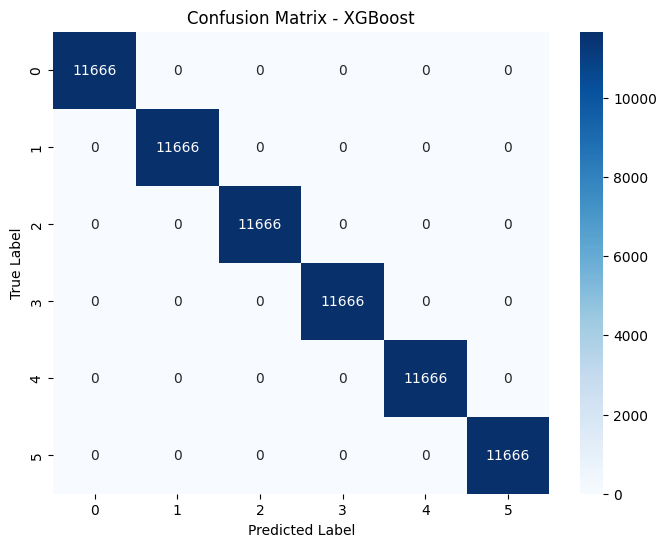

In [15]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_resampled, y_pred_xgb), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - XGBoost")
plt.show()

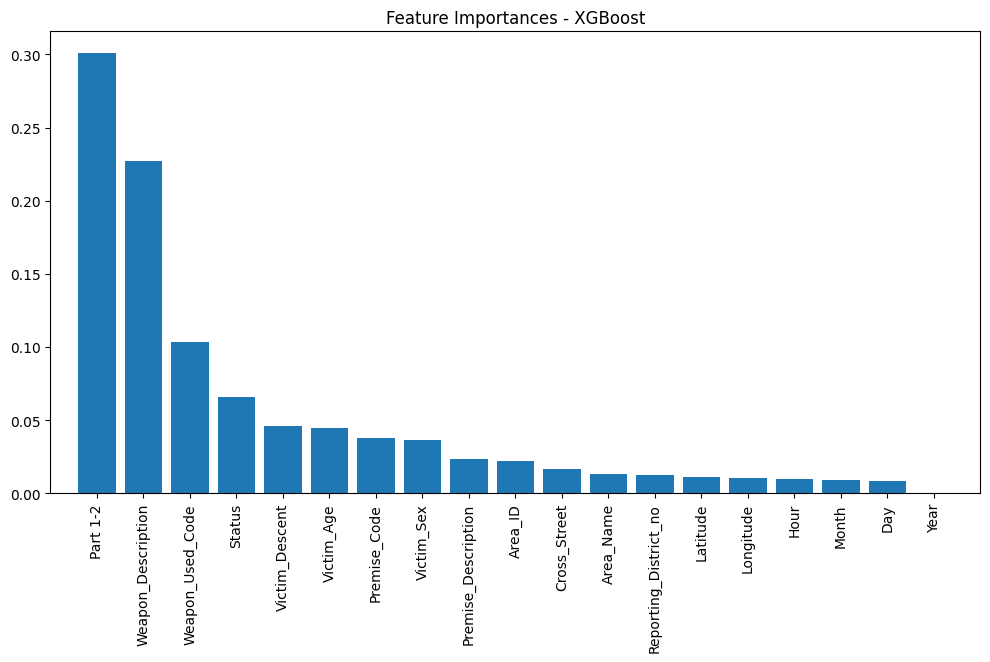

In [16]:
xgb_importances = best_xgb.feature_importances_
features = X.columns
indices = np.argsort(xgb_importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importances - XGBoost")
plt.bar(range(X.shape[1]), xgb_importances[indices], align="center")
plt.xticks(range(X.shape[1]), features[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

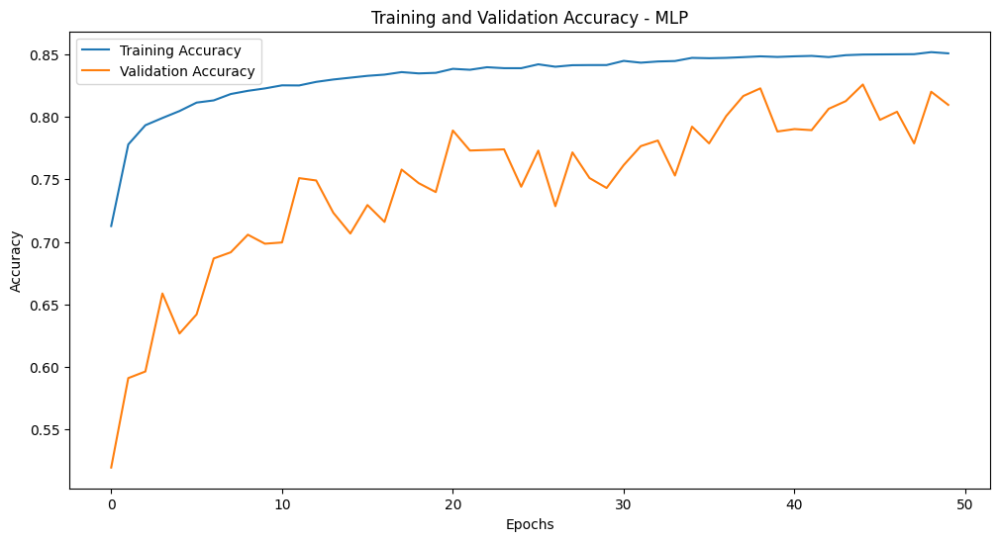

In [17]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy - MLP')
plt.legend()
plt.show()

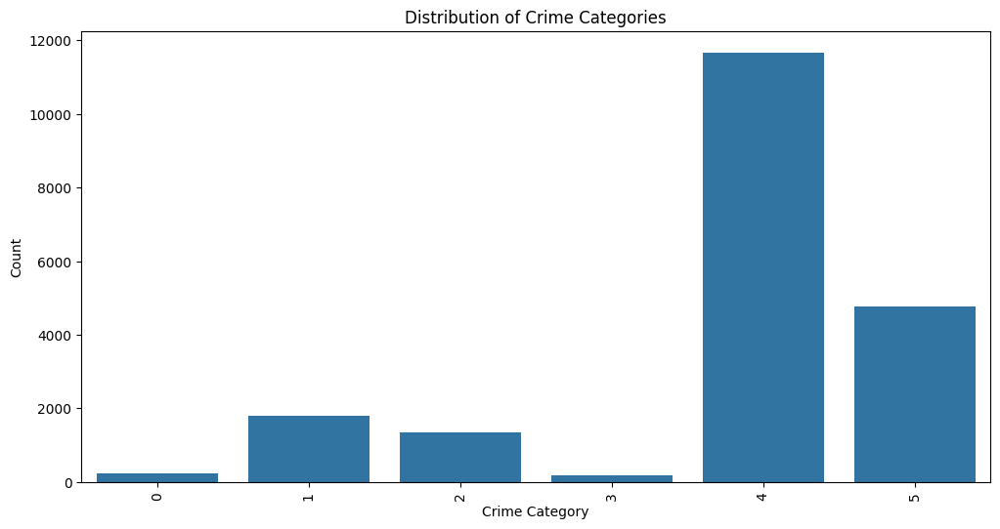

In [18]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Crime_Category', data=df)
plt.xlabel('Crime Category')
plt.ylabel('Count')
plt.title('Distribution of Crime Categories')
plt.xticks(rotation=90)
plt.show()


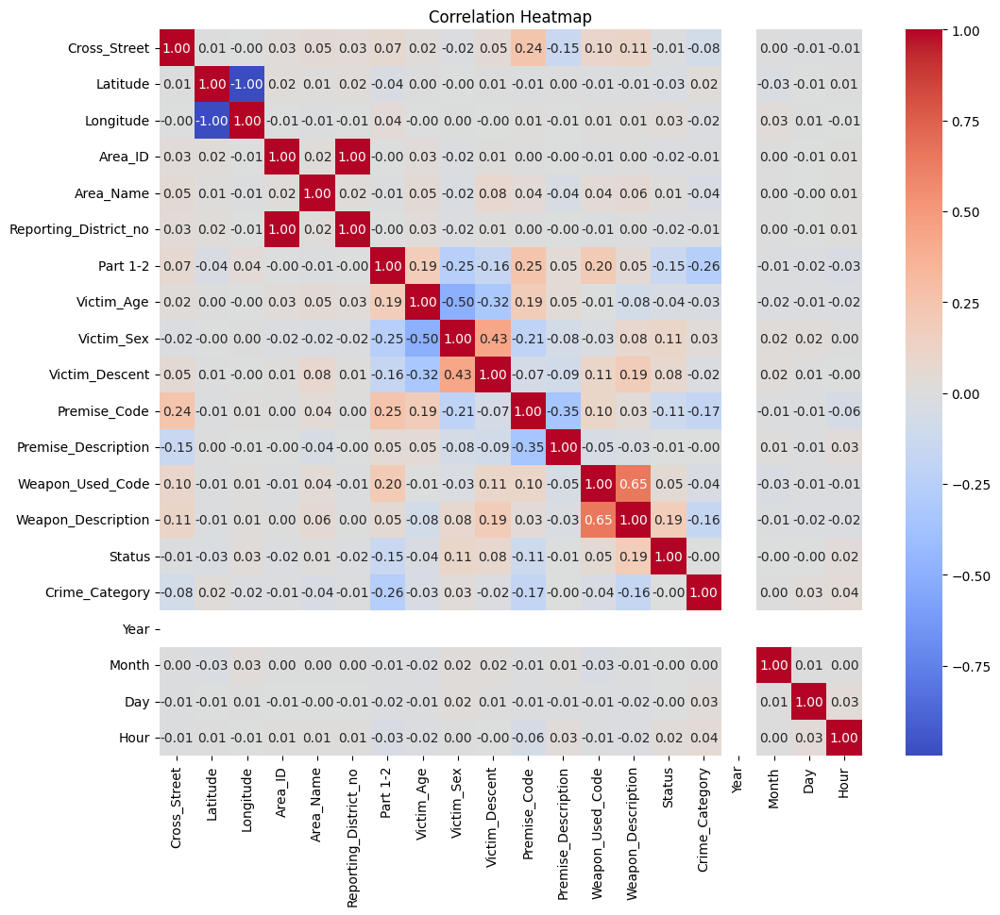

In [19]:
plt.figure(figsize=(12, 10))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

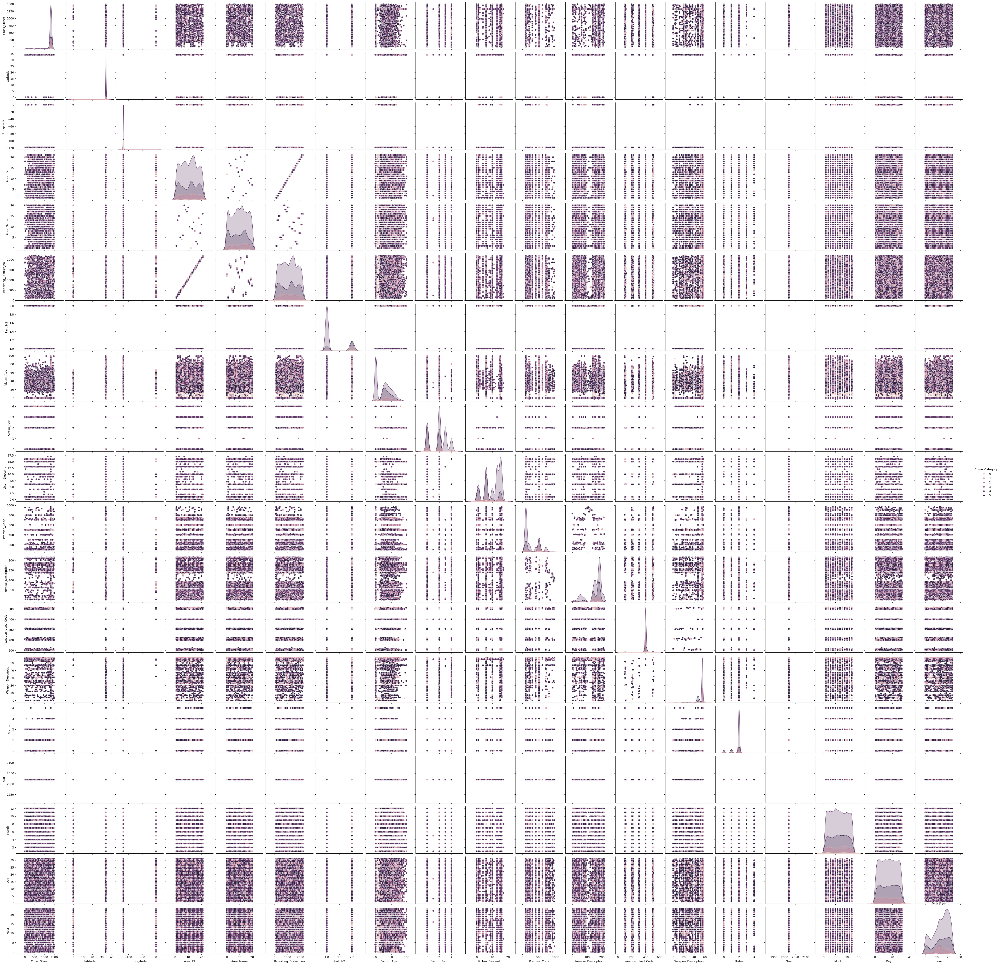

In [20]:
sns.pairplot(df, hue='Crime_Category', diag_kind='kde')
plt.title('Pair Plot')
plt.show()


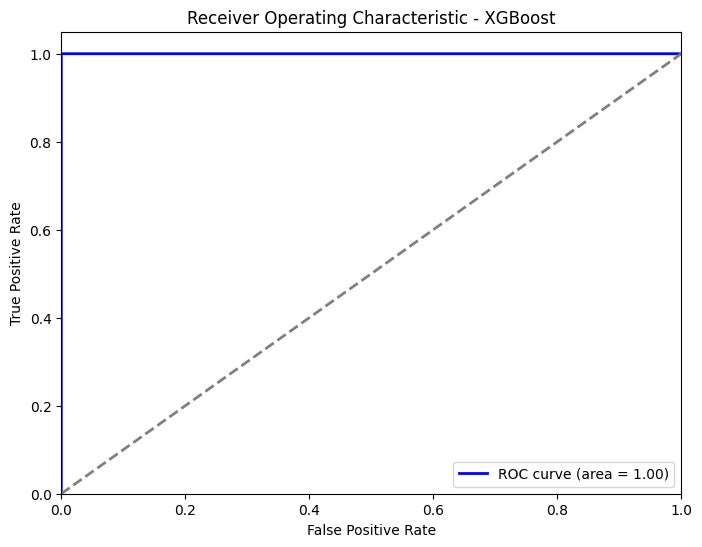

In [21]:
from sklearn.metrics import roc_curve, auc

fpr_xgb, tpr_xgb, _ = roc_curve(y_resampled, best_xgb.predict_proba(X_scaled)[:, 1], pos_label=1)
roc_auc_xgb = auc(fpr_xgb, tpr_xgb)

plt.figure(figsize=(8, 6))
plt.plot(fpr_xgb, tpr_xgb, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_xgb)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - XGBoost')
plt.legend(loc="lower right")
plt.show()

2188/2188 ━━━━━━━━━━━━━━━━━━━━ 1s 481us/step


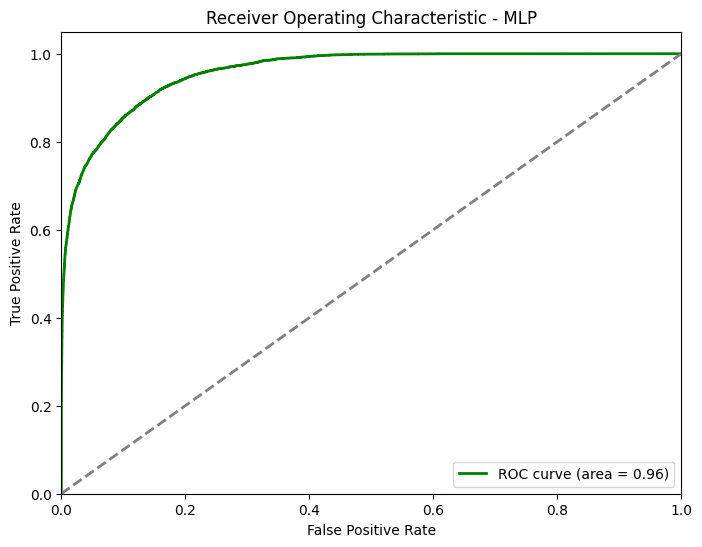

In [22]:
fpr_mlp, tpr_mlp, _ = roc_curve(y_resampled, mlp_model.predict(X_scaled)[:, 1], pos_label=1)
roc_auc_mlp = auc(fpr_mlp, tpr_mlp)

plt.figure(figsize=(8, 6))
plt.plot(fpr_mlp, tpr_mlp, color='green', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_mlp)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - MLP')
plt.legend(loc="lower right")
plt.show()

In [23]:
# Predict a sample input
# Create a sample input with the same structure as the original data
sample_input = pd.DataFrame({
    'Cross_Street': [1],  # Default value
    'Latitude': [-118.2437],
    'Longitude': [34.0522],
    'Area_ID': [1],  # Default value
    'Area_Name': [1],  # Default value
    'Reporting_District_no': [1],  # Default value
    'Part 1-2': [1],  # Default value
    'Victim_Age': [30],  # Default value
    'Victim_Sex': [1],  # Default value
    'Victim_Descent': [1],  # Default value
    'Premise_Code': [1],  # Default value
    'Premise_Description': [1],  # Default value
    'Weapon_Used_Code': [1],  # Default value
    'Weapon_Description': [1],  # Default value
    'Status': [1],  # Default value
    'Year': [2021],
    'Month': [7],
    'Day': [15],
    'Hour': [12]
})

# Scale the sample input
sample_input_scaled = scaler.transform(sample_input)
sample_prediction = best_xgb.predict(sample_input_scaled)
predicted_crime_category = label_encoders['Crime_Category'].inverse_transform(sample_prediction)
print(f"Predicted Crime Category for sample input: {predicted_crime_category[0]}")

Predicted Crime Category for sample input: Violent Crimes


In [24]:
# Predict a sample input
# Create a sample input with the same structure as the original data
sample_input = pd.DataFrame({
    'Cross_Street': [1],  # Default value
    'Latitude': [-118.2437],
    'Longitude': [34.0522],
    'Area_ID': [1],  # Default value
    'Area_Name': [1],  # Default value
    'Reporting_District_no': [1],  # Default value
    'Part 1-2': [1],  # Default value
    'Victim_Age': [30],  # Default value
    'Victim_Sex': [1],  # Default value
    'Victim_Descent': [1],  # Default value
    'Premise_Code': [1],  # Default value
    'Premise_Description': [1],  # Default value
    'Weapon_Used_Code': [1],  # Default value
    'Weapon_Description': [1],  # Default value
    'Status': [1],  # Default value
    'Year': [2021],
    'Month': [7],
    'Day': [15],
    'Hour': [12]
})

# Scale the sample input
sample_input_scaled = scaler.transform(sample_input)

# Predict using XGBoost model
sample_prediction_xgb = best_xgb.predict(sample_input_scaled)
predicted_crime_category_xgb = label_encoders['Crime_Category'].inverse_transform(sample_prediction_xgb)
print(f"Predicted Crime Category for sample input using XGBoost: {predicted_crime_category_xgb[0]}")

# Predict using MLP model
sample_prediction_mlp = np.argmax(mlp_model.predict(sample_input_scaled), axis=1)
predicted_crime_category_mlp = label_encoders['Crime_Category'].inverse_transform(sample_prediction_mlp)
print(f"Predicted Crime Category for sample input using MLP: {predicted_crime_category_mlp[0]}")

Predicted Crime Category for sample input using XGBoost: Violent Crimes
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted Crime Category for sample input using MLP: Violent Crimes


In [25]:
# Predict a sample input
# Create a sample input with the same structure as the original data
sample_input = pd.DataFrame({
    'Cross_Street': [1],  # Default value
    'Latitude': [-118.2437],
    'Longitude': [34.0522],
    'Area_ID': [1],  # Default value
    'Area_Name': [1],  # Default value
    'Reporting_District_no': [1],  # Default value
    'Part 1-2': [1],  # Default value
    'Victim_Age': [30],  # Default value
    'Victim_Sex': [1],  # Default value
    'Victim_Descent': [1],  # Default value
    'Premise_Code': [1],  # Default value
    'Premise_Description': [1],  # Default value
    'Weapon_Used_Code': [1],  # Default value
    'Weapon_Description': [1],  # Default value
    'Status': [1],  # Default value
    'Year': [2021],
    'Month': [7],
    'Day': [15],
    'Hour': [12]
})

# Ensure the columns are in the same order as in the original dataset
sample_input = sample_input[X.columns]

# Scale the sample input
sample_input_scaled = scaler.transform(sample_input)

# Predict probabilities using XGBoost model
sample_prob_xgb = best_xgb.predict_proba(sample_input_scaled)

# Predict probabilities using MLP model
sample_prob_mlp = mlp_model.predict(sample_input_scaled)

# Combine the probabilities by averaging
combined_prob = (sample_prob_xgb + sample_prob_mlp) / 2

# Determine the final prediction based on the highest average probability
combined_prediction = np.argmax(combined_prob, axis=1)
predicted_crime_category_combined = label_encoders['Crime_Category'].inverse_transform(combined_prediction)
print(f"Predicted Crime Category for sample input using combined model: {predicted_crime_category_combined[0]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Predicted Crime Category for sample input using combined model: Violent Crimes


In [26]:
# Save the Models and Scaler
joblib.dump(best_xgb, "xgboost_model.joblib")
mlp_model.save("mlp_model.keras")  # Save the MLP model in Keras format
joblib.dump(scaler, "scaler.joblib")
print("Models and scaler saved successfully!")

# Load the Models and Scaler
xgboost_model = joblib.load("xgboost_model.joblib")
mlp_model = tf.keras.models.load_model("mlp_model.keras")  # Load the MLP model in Keras format
scaler = joblib.load("scaler.joblib")
print("Models and scaler loaded successfully!")

Models and scaler saved successfully!
Models and scaler loaded successfully!


In [27]:
joblib.dump(label_encoders, "label_encoders.joblib")
print("Label encoders saved successfully!")

Label encoders saved successfully!
